# Imports

In [1]:
pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-aa8gp6om
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-aa8gp6om
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 21.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 46.6 MB/s eta 0:00:00
  Created wheel for clip: filen

In [2]:
import torch
import torchvision.models as models
from torchvision import transforms
import clip
import cv2
import matplotlib.pyplot as plt
import os
from PIL import Image
import seaborn as sns
import pandas as pd
import torch.nn.functional as F
import time
import numpy as np

# Selecting Device

In [3]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device selected: {device}")

Device selected: cuda


# 3.1

## Inference using CLIP

In [4]:
# Checking for all the available models with clip
print(clip.available_models())

['RN50', 'RN101', 'RN50x4', 'RN50x16', 'RN50x64', 'ViT-B/32', 'ViT-B/16', 'ViT-L/14', 'ViT-L/14@336px']


In [5]:
# Loading ResNet-50 model in 2 different ways
# 1. IMAGENET1k_V1 pretrained ResNet-50
rn50_model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1).to(device)
# Preprocessing to ImageNet Images before passing to RN50
preprocess_rn50 = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])
rn50_model.eval()
print("=== ImageNet Pretrained ResNet-50 Architecture ===")
print(rn50_model)
print("\n")

# 2. OpenAI's CLIP ResNet-50
clip_model, preprocess_clip = clip.load("RN50", device=device)
clip_model.eval()
print("=== CLIP ResNet-50 Architecture (Visual) ===")
print(clip_model.visual)

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 186MB/s]


=== ImageNet Pretrained ResNet-50 Architecture ===
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (

100%|███████████████████████████████████████| 244M/244M [00:04<00:00, 52.6MiB/s]


=== CLIP ResNet-50 Architecture (Visual) ===
ModifiedResNet(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu1): ReLU(inplace=True)
  (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu2): ReLU(inplace=True)
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu3): ReLU(inplace=True)
  (avgpool): AvgPool2d(kernel_size=2, stride=2, padding=0)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu1): ReLU(inplace=True)
      (c

| #  | Difference                                                                                              | Original ResNet-50                                                                 | CLIP's Modified ResNet-50                                                          |
|----|---------------------------------------------------------------------------------------------------------|------------------------------------------------------------------------------------|-------------------------------------------------------------------------------------|
| 1  | Initial convolution block                                                                               | Single `Conv2d + BN + ReLU`                                                        | Three sequential `Conv2d + BN + ReLU` layers                                       |
| 2  | Pooling after initial conv block                                                                        | `MaxPool2d`                                                                        | `AvgPool2d`                                                                         |
| 3  | Bottleneck block structure                                                                              | `Conv2d + BN` for each conv, `ReLU` only after the third conv                      | `Conv2d + BN + ReLU` applied after each convolution                                |
| 4  | Downsampling in the first bottleneck block                                                              | `Conv2d + BN`                                                                      | Extra `AvgPool2d` layer added before `Conv2d + BN`                                 |
| 5  | Downsampling in later bottleneck blocks                                                                 | Present if input and output dimensions differ                                      | Only present in the first bottleneck; others do not include downsampling blocks    |
| 6  | Extra pooling in bottleneck blocks                                                                      | No pooling layers inside bottlenecks                                               | `AvgPool2d` after the second conv in the **first** bottleneck of each layer (except Layer 1) |
| 7  | Identity layers in bottlenecks                                                                          | Not used                                                                           | `avgpool = Identity()` for all bottlenecks **except** the first in each layer (from Layer 2) |
| 8  | Layer 3 structure                                                                                       | Standard bottleneck blocks                                                         | Same structure as Layer 2 in CLIP's encoder                                        |
| 9  | Layer 4 structure                                                                                       | Standard bottleneck blocks                                                         | Same structure as Layer 3 in CLIP's encoder                                        |
| 10 | Number of bottleneck blocks per layer                                                                   | Layer 1: 3, Layer 2: 4, Layer 3: 6, Layer 4: 3                                     | Same: Layer 1: 3, Layer 2: 4, Layer 3: 6, Layer 4: 3                               |
| 11 | Final pooling + classifier                                                                              | `AdaptiveAvgPool2d` followed by a `Linear` layer                                   | Replaced by `AttentionPool2d` that uses attention over spatial features            |


## Setup Data

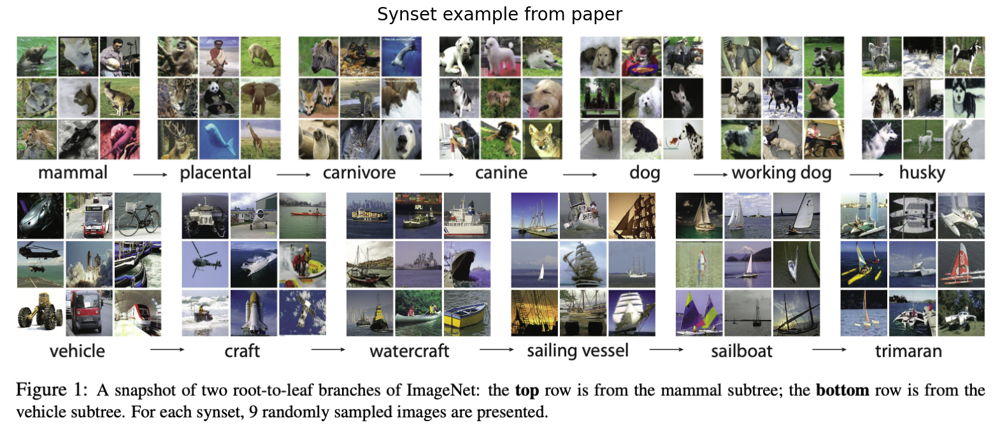

In [6]:
synset_img = cv2.imread("/kaggle/input/images/synset/synset.png")
synset_img = cv2.cvtColor(synset_img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.imshow(synset_img)
plt.title("Synset example from paper", fontsize=20)
plt.axis('off')
plt.show()

#### ImageNet Label Hierarchy

**Q1: What label hierarchy is used in ImageNet?**

ImageNet uses **WordNet's hierarchical structure** to organize its images. WordNet is like a dictionary that groups English words based on their meanings. In this hierarchy:

- Words with similar meanings are grouped together  
- These groups are arranged in a **tree-like structure**  
- Categories move from **general concepts to more specific ones**

**Example Hierarchy:**
Look at snapshot of Figure 1 taken from ImageNet paper, given above.

This organization helps computers understand relationships between different objects.

---

**Q2: What does a synset mean?**

A **synset** (short for *"synonym set"*) is a group of words or phrases that all mean the same thing. Think of it as a **concept** that might have several different names.

**Examples:**

- The synset for **"car"** includes: `automobile`, `car`, `auto`, `motorcar`  
- The synset for **"happy"** includes: `happy`, `joyful`, `glad`, `elated`

WordNet contains **117,000+ synsets**, each connected to others via relationships like:

- *"is a type of"*  
- *"is a part of"*

This builds a rich **network of meaningful connections** between concepts.

---

**Q3: Could grouping objects based on synsets lead to problems for visual recognition?**

**Yes**, synsets can cause challenges because **language-based groupings don’t always align with visual similarities.**

**Example:**  
The synset for **"mouse"** includes both:

- the *animal* (rodent)  
- the *computer device*  

A visual recognition model might **confuse these two visually unrelated objects** because they share the same label in WordNet.

---

**Q4: State 3 types of visual differences in images with objects from the same synset.**

1. **Appearance Variations**  
   - *Example:* Different dog breeds (e.g., **Chihuahua** vs. **Husky**) under the synset "dog" — varying **sizes, colors, shapes**.

2. **Viewpoint or Pose Differences**  
   - *Example:* A **chair** photographed from the front (showing legs) vs. the back (showing only the seat).

3. **Functional Similarity but Visual Dissimilarity**  
   - *Example:* "Mobile phone" synset could include **old flip phones** vs. **modern smartphones** — same function, **different visuals**.

---

**Key Takeaways**

- Synsets work well for **language**, but may not capture **visual nuances**.  
- Models trained on ImageNet must handle **wide visual diversity** within a single synset.

---

**References:**

- Princeton University. *"About WordNet."* WordNet. Princeton University, 2010.  
- J. Deng et al., *"ImageNet: A large-scale hierarchical image database,"* CVPR 2009. DOI: [10.1109/CVPR.2009.5206848](https://doi.org/10.1109/CVPR.2009.5206848)


## Setup zero-shot CLIP

### Function to load image

In [7]:
def get_images_and_gt_labels(folder_path):
    files = os.listdir(folder_path)
    images = []
    gt_labels = []
    for file in files:
        images.append(Image.open(f"{folder_path}/{file}"))
        file_name_parts = file[:-5].split("_") # Remove extension and split at underscore
        gt_label = ""
        for name_part in file_name_parts[1:]:
            gt_label += name_part
            gt_label += " "
        gt_label = gt_label[:-1]
        gt_labels.append(gt_label)
    return images, gt_labels

### Generating prompts and corresponding text features

In [8]:
# Generating text prompts for each of the imagenet class
imagenet_classes = ['tench', 'goldfish', 'great white shark', 'tiger shark', 'hammerhead', 'electric ray', 'stingray', 'cock', 'hen', 'ostrich', 'brambling', 'goldfinch', 'house finch', 'junco', 'indigo bunting', 'robin', 'bulbul', 'jay', 'magpie', 'chickadee', 'water ouzel', 'kite', 'bald eagle', 'vulture', 'great grey owl', 'European fire salamander', 'common newt', 'eft', 'spotted salamander', 'axolotl', 'bullfrog', 'tree frog', 'tailed frog', 'loggerhead', 'leatherback turtle', 'mud turtle', 'terrapin', 'box turtle', 'banded gecko', 'common iguana', 'American chameleon', 'whiptail', 'agama', 'frilled lizard', 'alligator lizard', 'Gila monster', 'green lizard', 'African chameleon', 'Komodo dragon', 'African crocodile', 'American alligator', 'triceratops', 'thunder snake', 'ringneck snake', 'hognose snake', 'green snake', 'king snake', 'garter snake', 'water snake', 'vine snake', 'night snake', 'boa constrictor', 'rock python', 'Indian cobra', 'green mamba', 'sea snake', 'horned viper', 'diamondback', 'sidewinder', 'trilobite', 'harvestman', 'scorpion', 'black and gold garden spider', 'barn spider', 'garden spider', 'black widow', 'tarantula', 'wolf spider', 'tick', 'centipede', 'black grouse', 'ptarmigan', 'ruffed grouse', 'prairie chicken', 'peacock', 'quail', 'partridge', 'African grey', 'macaw', 'sulphur-crested cockatoo', 'lorikeet', 'coucal', 'bee eater', 'hornbill', 'hummingbird', 'jacamar', 'toucan', 'drake', 'red-breasted merganser', 'goose', 'black swan', 'tusker', 'echidna', 'platypus', 'wallaby', 'koala', 'wombat', 'jellyfish', 'sea anemone', 'brain coral', 'flatworm', 'nematode', 'conch', 'snail', 'slug', 'sea slug', 'chiton', 'chambered nautilus', 'Dungeness crab', 'rock crab', 'fiddler crab', 'king crab', 'American lobster', 'spiny lobster', 'crayfish', 'hermit crab', 'isopod', 'white stork', 'black stork', 'spoonbill', 'flamingo', 'little blue heron', 'American egret', 'bittern', 'crane', 'limpkin', 'European gallinule', 'American coot', 'bustard', 'ruddy turnstone', 'red-backed sandpiper', 'redshank', 'dowitcher', 'oystercatcher', 'pelican', 'king penguin', 'albatross', 'grey whale', 'killer whale', 'dugong', 'sea lion', 'Chihuahua', 'Japanese spaniel', 'Maltese dog', 'Pekinese', 'Shih-Tzu', 'Blenheim spaniel', 'papillon', 'toy terrier', 'Rhodesian ridgeback', 'Afghan hound', 'basset', 'beagle', 'bloodhound', 'bluetick', 'black-and-tan coonhound', 'Walker hound', 'English foxhound', 'redbone', 'borzoi', 'Irish wolfhound', 'Italian greyhound', 'whippet', 'Ibizan hound', 'Norwegian elkhound', 'otterhound', 'Saluki', 'Scottish deerhound', 'Weimaraner', 'Staffordshire bullterrier', 'American Staffordshire terrier', 'Bedlington terrier', 'Border terrier', 'Kerry blue terrier', 'Irish terrier', 'Norfolk terrier', 'Norwich terrier', 'Yorkshire terrier', 'wire-haired fox terrier', 'Lakeland terrier', 'Sealyham terrier', 'Airedale', 'cairn', 'Australian terrier', 'Dandie Dinmont', 'Boston bull', 'miniature schnauzer', 'giant schnauzer', 'standard schnauzer', 'Scotch terrier', 'Tibetan terrier', 'silky terrier', 'soft-coated wheaten terrier', 'West Highland white terrier', 'Lhasa', 'flat-coated retriever', 'curly-coated retriever', 'golden retriever', 'Labrador retriever', 'Chesapeake Bay retriever', 'German short-haired pointer', 'vizsla', 'English setter', 'Irish setter', 'Gordon setter', 'Brittany spaniel', 'clumber', 'English springer', 'Welsh springer spaniel', 'cocker spaniel', 'Sussex spaniel', 'Irish water spaniel', 'kuvasz', 'schipperke', 'groenendael', 'malinois', 'briard', 'kelpie', 'komondor', 'Old English sheepdog', 'Shetland sheepdog', 'collie', 'Border collie', 'Bouvier des Flandres', 'Rottweiler', 'German shepherd', 'Doberman', 'miniature pinscher', 'Greater Swiss Mountain dog', 'Bernese mountain dog', 'Appenzeller', 'EntleBucher', 'boxer', 'bull mastiff', 'Tibetan mastiff', 'French bulldog', 'Great Dane', 'Saint Bernard', 'Eskimo dog', 'malamute', 'Siberian husky', 'dalmatian', 'affenpinscher', 'basenji', 'pug', 'Leonberg', 'Newfoundland', 'Great Pyrenees', 'Samoyed', 'Pomeranian', 'chow', 'keeshond', 'Brabancon griffon', 'Pembroke', 'Cardigan', 'toy poodle', 'miniature poodle', 'standard poodle', 'Mexican hairless', 'timber wolf', 'white wolf', 'red wolf', 'coyote', 'dingo', 'dhole', 'African hunting dog', 'hyena', 'red fox', 'kit fox', 'Arctic fox', 'grey fox', 'tabby', 'tiger cat', 'Persian cat', 'Siamese cat', 'Egyptian cat', 'cougar', 'lynx', 'leopard', 'snow leopard', 'jaguar', 'lion', 'tiger', 'cheetah', 'brown bear', 'American black bear', 'ice bear', 'sloth bear', 'mongoose', 'meerkat', 'tiger beetle', 'ladybug', 'ground beetle', 'long-horned beetle', 'leaf beetle', 'dung beetle', 'rhinoceros beetle', 'weevil', 'fly', 'bee', 'ant', 'grasshopper', 'cricket', 'walking stick', 'cockroach', 'mantis', 'cicada', 'leafhopper', 'lacewing', 'dragonfly', 'damselfly', 'admiral', 'ringlet', 'monarch', 'cabbage butterfly', 'sulphur butterfly', 'lycaenid', 'starfish', 'sea urchin', 'sea cucumber', 'wood rabbit', 'hare', 'Angora', 'hamster', 'porcupine', 'fox squirrel', 'marmot', 'beaver', 'guinea pig', 'sorrel', 'zebra', 'hog', 'wild boar', 'warthog', 'hippopotamus', 'ox', 'water buffalo', 'bison', 'ram', 'bighorn', 'ibex', 'hartebeest', 'impala', 'gazelle', 'Arabian camel', 'llama', 'weasel', 'mink', 'polecat', 'black-footed ferret', 'otter', 'skunk', 'badger', 'armadillo', 'three-toed sloth', 'orangutan', 'gorilla', 'chimpanzee', 'gibbon', 'siamang', 'guenon', 'patas', 'baboon', 'macaque', 'langur', 'colobus', 'proboscis monkey', 'marmoset', 'capuchin', 'howler monkey', 'titi', 'spider monkey', 'squirrel monkey', 'Madagascar cat', 'indri', 'Indian elephant', 'African elephant', 'lesser panda', 'giant panda', 'barracouta', 'eel', 'coho', 'rock beauty', 'anemone fish', 'sturgeon', 'gar', 'lionfish', 'puffer', 'abacus', 'abaya', 'academic gown', 'accordion', 'acoustic guitar', 'aircraft carrier', 'airliner', 'airship', 'altar', 'ambulance', 'amphibian', 'analog clock', 'apiary', 'apron', 'ashcan', 'assault rifle', 'backpack', 'bakery', 'balance beam', 'balloon', 'ballpoint', 'Band Aid', 'banjo', 'bannister', 'barbell', 'barber chair', 'barbershop', 'barn', 'barometer', 'barrel', 'barrow', 'baseball', 'basketball', 'bassinet', 'bassoon', 'bathing cap', 'bath towel', 'bathtub', 'beach wagon', 'beacon', 'beaker', 'bearskin', 'beer bottle', 'beer glass', 'bell cote', 'bib', 'bicycle-built-for-two', 'bikini', 'binder', 'binoculars', 'birdhouse', 'boathouse', 'bobsled', 'bolo tie', 'bonnet', 'bookcase', 'bookshop', 'bottlecap', 'bow', 'bow tie', 'brass', 'brassiere', 'breakwater', 'breastplate', 'broom', 'bucket', 'buckle', 'bulletproof vest', 'bullet train', 'butcher shop', 'cab', 'caldron', 'candle', 'cannon', 'canoe', 'can opener', 'cardigan', 'car mirror', 'carousel', "carpenter's kit", 'carton', 'car wheel', 'cash machine', 'cassette', 'cassette player', 'castle', 'catamaran', 'CD player', 'cello', 'cellular telephone', 'chain', 'chainlink fence', 'chain mail', 'chain saw', 'chest', 'chiffonier', 'chime', 'china cabinet', 'Christmas stocking', 'church', 'cinema', 'cleaver', 'cliff dwelling', 'cloak', 'clog', 'cocktail shaker', 'coffee mug', 'coffeepot', 'coil', 'combination lock', 'computer keyboard', 'confectionery', 'container ship', 'convertible', 'corkscrew', 'cornet', 'cowboy boot', 'cowboy hat', 'cradle', 'crane', 'crash helmet', 'crate', 'crib', 'Crock Pot', 'croquet ball', 'crutch', 'cuirass', 'dam', 'desk', 'desktop computer', 'dial telephone', 'diaper', 'digital clock', 'digital watch', 'dining table', 'dishrag', 'dishwasher', 'disk brake', 'dock', 'dogsled', 'dome', 'doormat', 'drilling platform', 'drum', 'drumstick', 'dumbbell', 'Dutch oven', 'electric fan', 'electric guitar', 'electric locomotive', 'entertainment center', 'envelope', 'espresso maker', 'face powder', 'feather boa', 'file', 'fireboat', 'fire engine', 'fire screen', 'flagpole', 'flute', 'folding chair', 'football helmet', 'forklift', 'fountain', 'fountain pen', 'four-poster', 'freight car', 'French horn', 'frying pan', 'fur coat', 'garbage truck', 'gasmask', 'gas pump', 'goblet', 'go-kart', 'golf ball', 'golfcart', 'gondola', 'gong', 'gown', 'grand piano', 'greenhouse', 'grille', 'grocery store', 'guillotine', 'hair slide', 'hair spray', 'half track', 'hammer', 'hamper', 'hand blower', 'hand-held computer', 'handkerchief', 'hard disc', 'harmonica', 'harp', 'harvester', 'hatchet', 'holster', 'home theater', 'honeycomb', 'hook', 'hoopskirt', 'horizontal bar', 'horse cart', 'hourglass', 'iPod', 'iron', "jack-o'-lantern", 'jean', 'jeep', 'jersey', 'jigsaw puzzle', 'jinrikisha', 'joystick', 'kimono', 'knee pad', 'knot', 'lab coat', 'ladle', 'lampshade', 'laptop', 'lawn mower', 'lens cap', 'letter opener', 'library', 'lifeboat', 'lighter', 'limousine', 'liner', 'lipstick', 'Loafer', 'lotion', 'loudspeaker', 'loupe', 'lumbermill', 'magnetic compass', 'mailbag', 'mailbox', 'maillot', 'maillot', 'manhole cover', 'maraca', 'marimba', 'mask', 'matchstick', 'maypole', 'maze', 'measuring cup', 'medicine chest', 'megalith', 'microphone', 'microwave', 'military uniform', 'milk can', 'minibus', 'miniskirt', 'minivan', 'missile', 'mitten', 'mixing bowl', 'mobile home', 'Model T', 'modem', 'monastery', 'monitor', 'moped', 'mortar', 'mortarboard', 'mosque', 'mosquito net', 'motor scooter', 'mountain bike', 'mountain tent', 'mouse', 'mousetrap', 'moving van', 'muzzle', 'nail', 'neck brace', 'necklace', 'nipple', 'notebook', 'obelisk', 'oboe', 'ocarina', 'odometer', 'oil filter', 'organ', 'oscilloscope', 'overskirt', 'oxcart', 'oxygen mask', 'packet', 'paddle', 'paddlewheel', 'padlock', 'paintbrush', 'pajama', 'palace', 'panpipe', 'paper towel', 'parachute', 'parallel bars', 'park bench', 'parking meter', 'passenger car', 'patio', 'pay-phone', 'pedestal', 'pencil box', 'pencil sharpener', 'perfume', 'Petri dish', 'photocopier', 'pick', 'pickelhaube', 'picket fence', 'pickup', 'pier', 'piggy bank', 'pill bottle', 'pillow', 'ping-pong ball', 'pinwheel', 'pirate', 'pitcher', 'plane', 'planetarium', 'plastic bag', 'plate rack', 'plow', 'plunger', 'Polaroid camera', 'pole', 'police van', 'poncho', 'pool table', 'pop bottle', 'pot', "potter's wheel", 'power drill', 'prayer rug', 'printer', 'prison', 'projectile', 'projector', 'puck', 'punching bag', 'purse', 'quill', 'quilt', 'racer', 'racket', 'radiator', 'radio', 'radio telescope', 'rain barrel', 'recreational vehicle', 'reel', 'reflex camera', 'refrigerator', 'remote control', 'restaurant', 'revolver', 'rifle', 'rocking chair', 'rotisserie', 'rubber eraser', 'rugby ball', 'rule', 'running shoe', 'safe', 'safety pin', 'saltshaker', 'sandal', 'sarong', 'sax', 'scabbard', 'scale', 'school bus', 'schooner', 'scoreboard', 'screen', 'screw', 'screwdriver', 'seat belt', 'sewing machine', 'shield', 'shoe shop', 'shoji', 'shopping basket', 'shopping cart', 'shovel', 'shower cap', 'shower curtain', 'ski', 'ski mask', 'sleeping bag', 'slide rule', 'sliding door', 'slot', 'snorkel', 'snowmobile', 'snowplow', 'soap dispenser', 'soccer ball', 'sock', 'solar dish', 'sombrero', 'soup bowl', 'space bar', 'space heater', 'space shuttle', 'spatula', 'speedboat', 'spider web', 'spindle', 'sports car', 'spotlight', 'stage', 'steam locomotive', 'steel arch bridge', 'steel drum', 'stethoscope', 'stole', 'stone wall', 'stopwatch', 'stove', 'strainer', 'streetcar', 'stretcher', 'studio couch', 'stupa', 'submarine', 'suit', 'sundial', 'sunglass', 'sunglasses', 'sunscreen', 'suspension bridge', 'swab', 'sweatshirt', 'swimming trunks', 'swing', 'switch', 'syringe', 'table lamp', 'tank', 'tape player', 'teapot', 'teddy', 'television', 'tennis ball', 'thatch', 'theater curtain', 'thimble', 'thresher', 'throne', 'tile roof', 'toaster', 'tobacco shop', 'toilet seat', 'torch', 'totem pole', 'tow truck', 'toyshop', 'tractor', 'trailer truck', 'tray', 'trench coat', 'tricycle', 'trimaran', 'tripod', 'triumphal arch', 'trolleybus', 'trombone', 'tub', 'turnstile', 'typewriter keyboard', 'umbrella', 'unicycle', 'upright', 'vacuum', 'vase', 'vault', 'velvet', 'vending machine', 'vestment', 'viaduct', 'violin', 'volleyball', 'waffle iron', 'wall clock', 'wallet', 'wardrobe', 'warplane', 'washbasin', 'washer', 'water bottle', 'water jug', 'water tower', 'whiskey jug', 'whistle', 'wig', 'window screen', 'window shade', 'Windsor tie', 'wine bottle', 'wing', 'wok', 'wooden spoon', 'wool', 'worm fence', 'wreck', 'yawl', 'yurt', 'web site', 'comic book', 'crossword puzzle', 'street sign', 'traffic light', 'book jacket', 'menu', 'plate', 'guacamole', 'consomme', 'hot pot', 'trifle', 'ice cream', 'ice lolly', 'French loaf', 'bagel', 'pretzel', 'cheeseburger', 'hotdog', 'mashed potato', 'head cabbage', 'broccoli', 'cauliflower', 'zucchini', 'spaghetti squash', 'acorn squash', 'butternut squash', 'cucumber', 'artichoke', 'bell pepper', 'cardoon', 'mushroom', 'Granny Smith', 'strawberry', 'orange', 'lemon', 'fig', 'pineapple', 'banana', 'jackfruit', 'custard apple', 'pomegranate', 'hay', 'carbonara', 'chocolate sauce', 'dough', 'meat loaf', 'pizza', 'potpie', 'burrito', 'red wine', 'espresso', 'cup', 'eggnog', 'alp', 'bubble', 'cliff', 'coral reef', 'geyser', 'lakeside', 'promontory', 'sandbar', 'seashore', 'valley', 'volcano', 'ballplayer', 'groom', 'scuba diver', 'rapeseed', 'daisy', "yellow lady's slipper", 'corn', 'acorn', 'hip', 'buckeye', 'coral fungus', 'agaric', 'gyromitra', 'stinkhorn', 'earthstar', 'hen-of-the-woods', 'bolete', 'ear', 'toilet tissue']
text_prompts = [f"a photo of a {label}" for label in imagenet_classes]

with torch.no_grad():
    text_tokens = clip.tokenize(text_prompts).to(device)
    text_features = clip_model.encode_text(text_tokens)
    text_features /= text_features.norm(dim=-1, keepdim=True)

### Testing on some image samples

#### Datasource

> I downloaded sample ImageNet dataset from: https://github.com/EliSchwartz/imagenet-sample-images/tree/master. This dataset contains 1 random image sample per class for each of the ImageNet Class from the original ImageNet Dataset.

> Used radom 3 images from this to visualise and run the initial test to test the working of CLIP.

<span style="color:red">Note: We need not reshape the final output of CLIP RN50 Visual encoder to 1000 as we are comparing the output with the cosine similarity between the output and the prompt features.</span>

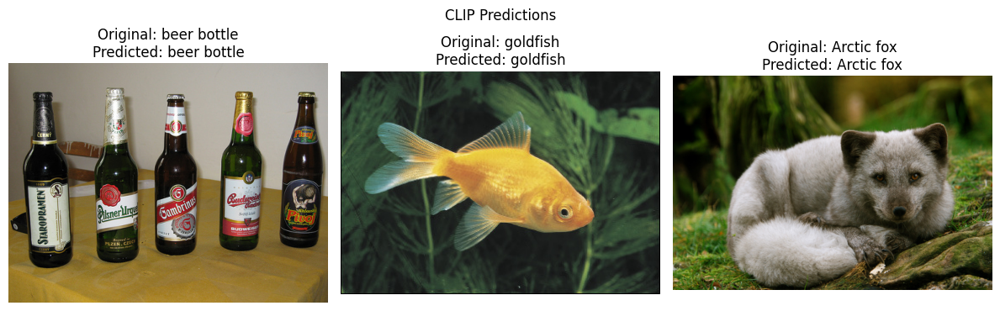

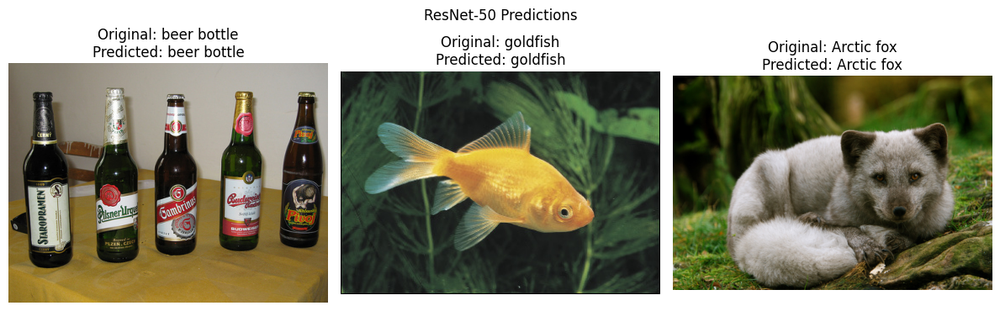

In [9]:
folder_path = "/kaggle/input/imagenet-sample-images-v4/sample-images/sample-for-visualisation"
sample_images, sample_gt_labels = get_images_and_gt_labels(folder_path)

fig, axes = plt.subplots(1, len(sample_images), figsize=(12, 4))

for i in range(len(sample_images)):
    img = preprocess_clip(sample_images[i]).unsqueeze(0).to(device)

    # Encode image
    with torch.no_grad():
        img_features = clip_model.encode_image(img)
        img_features /= img_features.norm(dim=-1, keepdim=True)

        # Compute cosine similarity (as logits)
        logits_per_image = (100.0 * img_features @ text_features.T)
        probs = logits_per_image.softmax(dim=-1)

        # Get top-1 prediction
        top_label = probs[0].argmax().item()
        
    axes[i].imshow(sample_images[i])
    axes[i].axis('off')
    
    # Set the title with only the predicted label
    axes[i].set_title(f"Original: {sample_gt_labels[i]}\nPredicted: {imagenet_classes[top_label]}")

plt.suptitle("CLIP Predictions")
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, len(sample_images), figsize=(12, 4))

for i in range(len(sample_images)):
    img = preprocess_rn50(sample_images[i]).unsqueeze(0).to(device)
        
    with torch.no_grad():
        output = rn50_model(img)
        probs = F.softmax(output, dim=1)  # Convert logits to probabilities

        # Get top-1 prediction
        top_label = probs[0].argmax().item()
        
    axes[i].imshow(sample_images[i])
    axes[i].axis('off')
    
    # Set the title with only the predicted label
    axes[i].set_title(f"Original: {sample_gt_labels[i]}\nPredicted: {imagenet_classes[top_label]}")

plt.suptitle("ResNet-50 Predictions")
plt.tight_layout()
plt.show()

## CLIP vs ImageNet pretraining

### Finding 2 images for 10 selected ImageNet classes that work well with CLIP but not with ImageNet pretrained RN50

#### Datasource

> ImageNet-A Dataset (Adversarial): https://github.com/hendrycks/natural-adv-examples - downloaded the dataset and handpicked 2 images randomly from the above selected 10 classes.

> The uploaded dataset is in the form "/CLIP-better/\<class\>/\<image-with-false-name\> (The name of the image is from the original dataset, it is based on the class that the model predicts for that image and the enclosing folder name depicts the original class of the image)

In [10]:
# Selected ImageNet Classes
selected_classes = [
    "banana",
    "box turtle",
    "cheeseburger",
    "balloon",
    "lion",
    "candle",
    "school bus",
    "volleyball",
    "teddy",
    "bubble"
]

def clip_training(images, gt_labels):
    predicted_labels = []
    correct_preds = 0
    for i in range(len(images)):
        img = preprocess_clip(images[i]).unsqueeze(0).to(device)
    
        # Encode image
        with torch.no_grad():
            img_features = clip_model.encode_image(img)
            img_features /= img_features.norm(dim=-1, keepdim=True)
    
            # Compute cosine similarity (as logits)
            logits_per_image = (100.0 * img_features @ text_features.T)
            probs = logits_per_image.softmax(dim=-1)
    
            # Get top-5 prediction
            top_probs, top_labels = probs[0].topk(5)
            top_5_preds = []
            for label in top_labels:
                top_5_preds.append(imagenet_classes[label])
            if gt_labels[i] in top_5_preds:
                predicted_labels.append((gt_labels[i], top_5_preds.index(gt_labels[i])))
                correct_preds += 1
            else:
                predicted_labels.append((-1, -1))
    accuracy = round(correct_preds / len(gt_labels) * 100, 2)
    return predicted_labels, accuracy

def rn50_training(images, gt_labels):
    predicted_labels = []
    correct_preds = 0
    for i in range(len(images)):
        img = preprocess_rn50(images[i]).unsqueeze(0).to(device)
        
        with torch.no_grad():
            output = rn50_model(img)
            probs = F.softmax(output, dim=1)  # Convert logits to probabilities

        # Get top-5 predictions
        top_probs, top_labels = probs[0].topk(5)
        top_5_preds = [imagenet_classes[label] for label in top_labels]

        if gt_labels[i] in top_5_preds:
            predicted_labels.append((gt_labels[i], top_5_preds.index(gt_labels[i])))
            correct_preds += 1
        else:
            predicted_labels.append((-1, -1))

    accuracy = round(correct_preds / len(gt_labels) * 100, 2)
    return predicted_labels, accuracy

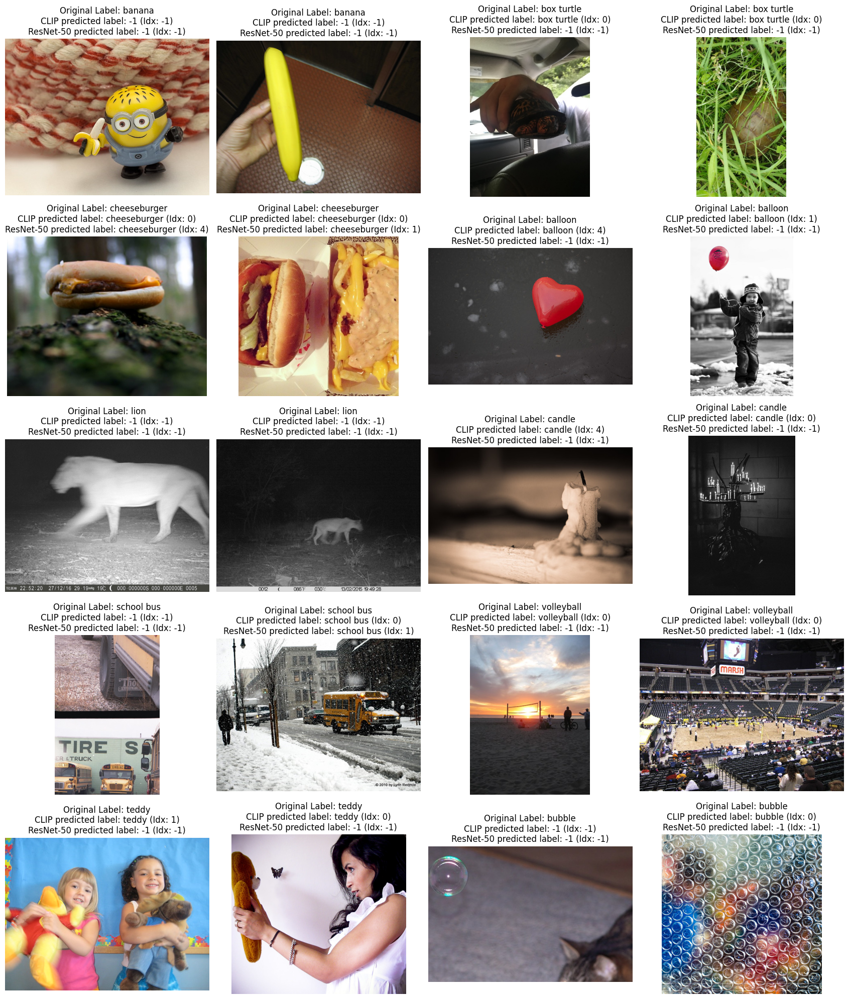

CLIP Accuracy = 70.0%
ResNet-50 Accuracy = 15.0%


In [11]:
clip_better_folder = "/kaggle/input/imagenet-sample-images-v4/sample-images/CLIP-better"

clip_better_sample_images, clip_better_gt_sample_labels = [], []
for label in selected_classes:
    clip_better_images, clip_better_gt_labels = get_images_and_gt_labels(f"{clip_better_folder}/{label}")
    clip_better_sample_images.extend(clip_better_images)
    clip_better_gt_sample_labels.extend([label] * len(clip_better_gt_labels)) # Please note that the original gt label is the name of the enclosing folder and not the one mentinoed in the image name

# Getting predicted labels for CLIP
clip_predicted_labels, clip_acc = clip_training(clip_better_sample_images, clip_better_gt_sample_labels)

# Getting predicted labels for RN50
resnet_predicted_labels, rn50_acc = rn50_training(clip_better_sample_images, clip_better_gt_sample_labels)

fig, axes = plt.subplots(5, 4, figsize=(17, 20))

for i, ax in enumerate(axes.flatten()):
    ax.imshow(clip_better_sample_images[i])
    ax.axis('off')
    ax.set_title(f"Original Label: {clip_better_gt_sample_labels[i]}\n"
                 f"CLIP predicted label: {clip_predicted_labels[i][0]} (Idx: {clip_predicted_labels[i][1]})\n"
                 f"ResNet-50 predicted label: {resnet_predicted_labels[i][0]} (Idx: {resnet_predicted_labels[i][1]})")

plt.tight_layout()
plt.show()

# Printing CLIP and resnet accuracies
print(f"CLIP Accuracy = {clip_acc}%")
print(f"ResNet-50 Accuracy = {rn50_acc}%")

> CLIP outperforms ResNet-50 in many real-world scenarios due to its ability to generalize beyond clean, curated datasets. Trained on web-scale image–text pairs, CLIP handles artistic, messy, or unusual visuals with ease, leveraging contextual understanding and compositional semantics to recognize objects even in cluttered or non-canonical settings. It performs well across varied styles, including cartoonish, dim-lit, or cropped images. In contrast, ResNet-50, trained solely on ImageNet, expects centered, stereotypical object views and struggles with scene context, style variations, and distribution shifts like blur, occlusion, or creative imagery.

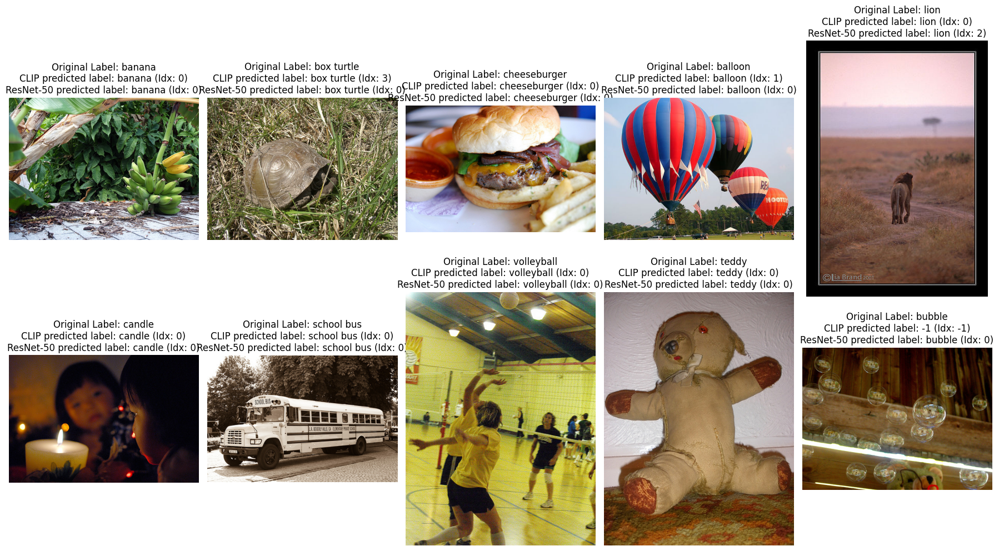

CLIP Accuracy = 90.0%
ResNet-50 Accuracy = 100.0%


In [12]:
rn50_better_folder = "/kaggle/input/imagenet-sample-images-v4/sample-images/RN50-better"

rn50_better_sample_images, rn50_better_gt_sample_labels = [], []
for label in selected_classes:
    rn50_better_images, rn50_better_gt_labels = get_images_and_gt_labels(f"{rn50_better_folder}/{label}")
    rn50_better_sample_images.extend(rn50_better_images)
    rn50_better_gt_sample_labels.extend([label] * len(rn50_better_gt_labels)) # Please note that the original gt label is the name of the enclosing folder and not the one mentinoed in the image name

# Getting predicted labels for CLIP
clip_predicted_labels, clip_acc = clip_training(rn50_better_sample_images, rn50_better_gt_sample_labels)

# Getting predicted labels for RN50
resnet_predicted_labels, rn50_acc = rn50_training(rn50_better_sample_images, rn50_better_gt_sample_labels)

fig, axes = plt.subplots(2, 5, figsize=(18, 10))

for i, ax in enumerate(axes.flatten()):
    ax.imshow(rn50_better_sample_images[i])
    ax.axis('off')
    ax.set_title(f"Original Label: {rn50_better_gt_sample_labels[i]}\n"
                 f"CLIP predicted label: {clip_predicted_labels[i][0]} (Idx: {clip_predicted_labels[i][1]})\n"
                 f"ResNet-50 predicted label: {resnet_predicted_labels[i][0]} (Idx: {resnet_predicted_labels[i][1]})")

plt.tight_layout()
plt.show()

# Printing CLIP and resnet accuracies
print(f"CLIP Accuracy = {clip_acc}%")
print(f"ResNet-50 Accuracy = {rn50_acc}%")

> RN50 accurately classifies it due to its training on curated object-centric ImageNet labels, while CLIP, trained on noisy web-text pairs, may associate the image with unrelated prompts like "dog toy" or "sports gear", leading to incorrect predictions.

## FP16

In [13]:
def measure_time(model, image_tensor, runs=100):
    image_tensor = image_tensor.to(device)

    # Warm-up
    for _ in range(10):
        _ = model(image_tensor)

    times = []
    for _ in range(runs):
        start = time.time()
        with torch.no_grad():
            _ = model(image_tensor)
        end = time.time()
        times.append(end - start)

    mean_time = np.mean(times)
    std_time = np.std(times)
    return mean_time, std_time

In [14]:
# Load and preprocess a sample image
image = preprocess_clip(Image.open("/kaggle/input/imagenet-sample-images-v4/sample-images/sample-for-visualisation/n01443537_goldfish.JPEG")).unsqueeze(0).to(device)

# FP32
mean_fp32, std_fp32 = measure_time(clip_model.visual.float(), image.float())

# FP16
mean_fp16, std_fp16 = measure_time(clip_model.visual.half(), image.half())

print(f"FP32: {mean_fp32:.6f}s ± {std_fp32:.6f}")
print(f"FP16: {mean_fp16:.6f}s ± {std_fp16:.6f}")

FP32: 0.006955s ± 0.000719
FP16: 0.008125s ± 0.000420


In [15]:
def plot_all_images_side_by_side(probs_fp32, probs_fp16, topk=5):
    num_images = len(probs_fp32)
    fig, axs = plt.subplots(1, num_images, figsize=(22, 5), constrained_layout=True)

    for i in range(num_images):
        fp32 = probs_fp32[i].detach().cpu()
        fp16 = probs_fp16[i].detach().cpu()
        diff = (fp32 - fp16).abs()

        # Top-k class indices based on FP32 probabilities
        topk_idxs = torch.topk(fp32, topk).indices
        labels = [f"C{j.item()}" for j in topk_idxs]
        fp32_topk = fp32[topk_idxs]
        fp16_topk = fp16[topk_idxs]
        diff_topk = diff[topk_idxs]

        x = np.arange(topk)
        width = 0.35

        ax = axs[i]
        ax.bar(x - width/2, fp32_topk, width, label='FP32', color="#4c72b0")
        ax.bar(x + width/2, fp16_topk, width, label='FP16', color="#55a868")

        # Annotate difference
        for j in range(topk):
            ax.plot([x[j]], [max(fp32_topk[j], fp16_topk[j]) + 0.01], 'ro', markersize=3)
            ax.text(x[j], max(fp32_topk[j], fp16_topk[j]) + 0.015, f"{diff_topk[j]:.4f}",
                    ha='center', va='bottom', fontsize=7, color='red')

        ax.set_title(f"Image {i+1}")
        ax.set_xticks(x)
        ax.set_xticklabels(labels, rotation=45, fontsize=8)
        ax.set_ylim(0, 1.1)
        ax.grid(axis='y', linestyle='--', alpha=0.5)
        if i == 0:
            ax.set_ylabel("Probability")
        if i == num_images - 1:
            ax.legend(loc='upper right', fontsize=8)

    fig.suptitle("FP32 vs FP16 Probabilities (Top-5 Classes per Image)", fontsize=14)
    plt.show()

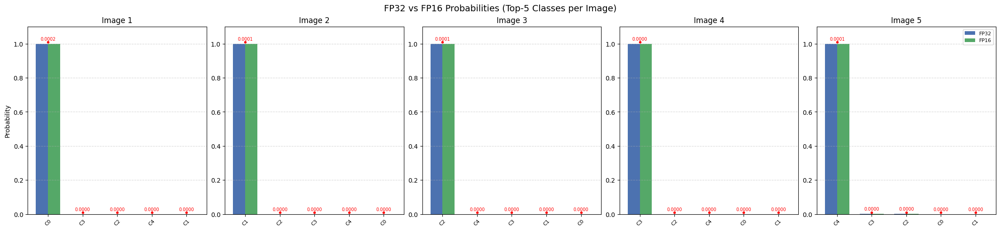

In [16]:
# Assume 5 class names
class_names = selected_classes[:5]
text_prompts = [f"a photo of a {label}" for label in class_names]

with torch.no_grad():
    text_tokens = clip.tokenize(text_prompts).to(device)
    text_features = clip_model.encode_text(text_tokens)
    text_features /= text_features.norm(dim=-1, keepdim=True)

# Load 5 images (1 per class)
folder_path = "/kaggle/input/imagenet-sample-images-v4/sample-images/RN50-better"

images, gt_labels = [], []
for label in class_names:
    images_temp, gt_labels_temp = get_images_and_gt_labels(f"{folder_path}/{label}")
    images.extend(images_temp)
    gt_labels.extend([label] * len(gt_labels_temp)) # Please note that the original gt label is the name of the enclosing folder and not the one mentinoed in the image name

image_tensors = torch.stack([preprocess_clip(img) for img in images]).to(device)

# FP32 encoding
with torch.no_grad():
    image_features_fp32 = clip_model.visual.float()(image_tensors.float())
    image_features_fp32 /= image_features_fp32.norm(dim=-1, keepdim=True)
    
    # Compute cosine similarity (as logits)
    logits_per_image_fp32 = (100.0 * image_features_fp32 @ text_features.float().T)
    probs_fp32 = logits_per_image_fp32.softmax(dim=-1)

# FP16 encoding
with torch.no_grad():
    image_features_fp16 = clip_model.visual.half()(image_tensors.half())
    image_features_fp16 /= image_features_fp16.norm(dim=-1, keepdim=True)
    
    # Compute cosine similarity (as logits)
    logits_per_image_fp16 = (100.0 * image_features_fp16 @ text_features.half().T)
    probs_fp16 = logits_per_image_fp16.softmax(dim=-1)

# Print and compare
# for i in range(5):
#     print(f"\nImage {i+1} probs (FP32): {probs_fp32[i]}")
#     print(f"Image {i+1} probs (FP16): {probs_fp16[i]}")
#     print(f"Diff: {(probs_fp32[i] - probs_fp16[i]).abs().max():.6f}")
plot_all_images_side_by_side(probs_fp32, probs_fp16)

In [17]:
from torch.profiler import profile, record_function, ProfilerActivity

In [18]:
image = preprocess_clip(Image.open("/kaggle/input/imagenet-sample-images-v4/sample-images/sample-for-visualisation/n01443537_goldfish.JPEG")).unsqueeze(0).to(device)

clip_model.visual.float()

with profile(activities=[ProfilerActivity.CPU, ProfilerActivity.CUDA],
             record_shapes=True,
             profile_memory=True,
             with_stack=True) as prof:

    with torch.no_grad():
        with record_function("model_inference"):
            _ = clip_model.encode_image(image)

# Print summarized report
print(prof.key_averages().table(sort_by="cuda_memory_usage"),)

-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
                                                   Name    Self CPU %      Self CPU   CPU total %     CPU total  CPU time avg     Self CUDA   Self CUDA %    CUDA total  CUDA time avg       CPU Mem  Self CPU Mem      CUDA Mem  Self CUDA Mem    # of Calls  
-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
                                            aten::empty         3.44%       1.059ms         3.44%       1.059ms       4.726us       0.000us         0.00%       0.000us       0.000us          16 b          16 b      55.20 Mb      55.20 M

In [19]:
clip_model.visual.half()

# Run the profiler
with profile(activities=[ProfilerActivity.CPU, ProfilerActivity.CUDA],
             record_shapes=True,
             profile_memory=True,
             with_stack=True) as prof:

    with torch.no_grad():
        with record_function("model_inference"):
            _ = clip_model.encode_image(image.half())

# Print summarized report
print(prof.key_averages().table(sort_by="cuda_memory_usage", row_limit=10))

-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
                                                   Name    Self CPU %      Self CPU   CPU total %     CPU total  CPU time avg     Self CUDA   Self CUDA %    CUDA total  CUDA time avg       CPU Mem  Self CPU Mem      CUDA Mem  Self CUDA Mem    # of Calls  
-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
                                    aten::empty_strided         5.09%       1.020ms         5.09%       1.020ms      18.222us       0.000us         0.00%       0.000us       0.000us           0 b           0 b      26.83 Mb      26.83 M